В этом блокноте с помощью аппроксимации экспериментальной кривой коэффициента отражения рассчитывается реальная и мнимая части диэлектрической проницаемости графеновых пленок разной толщины. Суть процедуры аппроксимации: 
1) по МНК или "вручную" найти угол резонанса по InSb, считая диэлектрическую проницаемость известной
2) найти сдвиг между экспериментальным и теоретическим минимумом InSb, сместить начало обеих осей x на это расстояние
3) аппроксимируя кривую графена по известному значению угла и сдвига, найти реальную и мнимую части д.п. графена


Вопросы:
1) Для МНК получается огромная погрешность д.п. Есть ли смысл повторно измерить? 
2) На теорвере матожидание отклонений точек было нулевое? Здесь очевидно, что это не так, можно ли оценивать доверительные интервалы по Фишеру? Независимы ли отклонения разных точек? Матрица ковариации - это и есть "доверительный" эллипсоид? 
3) учесть погрешность измерения в optimize curve ($\sigma$)
4) как вычисляется ковариация eps
5) некорректные обратные задачи?

Вопросы:
0) работают ли уравнения Максвелла для настолько тонких пленок
1) обоснование выбора участка суммирования: оценить влияние дифракции (систематическую погрешность), оптимальный отступ от границы; попробовать разные участки
2) учёт тензорного характера д.п. графена: яа) продольная и поперечная, б) вдоль толщины. Почему анизотропия только для плазмонов?
3) корректна ли аппроксимация, если резонанс сильно зависит от угла, который из-за дифракции определяется с точностью до десятых градуса; построить график ковариации от д.п., возможно есть смысл разобраться в алгоритмах optimize.curve()
4) по какому участку графика фитировать
5) почему ширина графиков InSb (и угол резонанса?) зависит от толщины графена (сдвиг может зависеть)
6) протестировать метод на InSb, одновременно фитировать его д.п., угол и сдвиг, сравнить д.п. с табличной;
7) протестировать 1 образец дважды, чтобы исключить случайную погрешность (помимо колебаний IMO, которые учтены нормировкой R)
8) какая ошибка в определении нуля гониометра и линейки?

Вопросы после доклада 17.11:
1) свойства образца: размер частиц, есть ли образец с другим размером
2) экспериментальная погрешность в статье photonics (5%??)
3) почему в photonics меньше дифракция?
4) можно расчитать угловое распределение и сделать поправку?
5) как устроен отсчёт нуля
6) почему диэлектрик при малом числе слоев; почему если Re>0, видим плазмоны 
7) роль InSb в распространении плазмона по графену; может ли идти плазмон в InSb если в графене Re>0 (работает ли условие разных знаков Re для трех слоев) и он тонкий (17 нм)
8) чистый PEDOT:PSS - будет ли ППР?
9) модель потери энергии (уширения), все ли входит в матрицы Френеля

Конспект по методам определения неопределенности (Вугрин)

1) Интервалы - общие (joint) или по одному параметру (предполагают независимость параметров)
2) The data itself may havesignificant uncertainties: there may be missing values,measurement error, systematic biases, etc. Nonlinear inverseproblems may involve discontinuities which result in mul-tiple values for the optimal parameters, due to complexitiesin the underlying physics (e.g., significant heterogeneities in material models). The parameters themselves may havesignificant variability as part of their inherent randomness.Finally, model form can also influence the parameter set-tings [Sun, 1999].
 
1. По линеаризации 

1) In linear models, the sum of
squares function is quadratic, and contours of constant sums
of squares are ellipses or ellipsoid surfaces. In nonlinear
models, if one approximates the nonlinear function with a
linear Taylor series expansion about the parameter estimate
^q, the sum of squares approximation is then quadratic.
2) Thus the confidence regions
computed with the linear approximation method may be
compromised by highly nonlinear models, small data sets,
or poor Hessian approximations.

#### NB У меня $R(\epsilon)$ = min в районе резонанса, а значит расчёт доверительного интервала по линейной модели может не работать? Посчитать гессиан символьно? 

2. По Фишеру:

1) Невязка $\leq$ const,  которая определяется по распределению Фишера
2) Гессиан не вычисляется

3. Логарифм.-макс.-правдоподобия тест

1) если ошибки нормально распределены, то сводится к МНК

зачем лазер: нужна высокая мощность (для области резонанса?) и пространственная когерентность

лсэ: испульсная генерация, но это не влияет

Плазмоны в металле тгц - нелокализованная волна - нельзя в сенсорах

In [2]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import sympy as sy
import ipywidgets as widgets


In [3]:
# Load data using configurable paths
# Output files are created in file aperture.ipynb

# Function to load data from file
def load_data(file_path):
    return pd.read_csv(file_path, sep='\t', decimal=',')

base_path = r'C:\Users\belco\Documents\Graphene\Data\Data_many_layers'

file_paths = {
    'data_3_5_along': os.path.join(base_path, r'2024.05.17_SPR+microscopy on InSb+Gr-3.5 layaer_197 um_New', r'output_along_3_5_full.ascii'),
    'data_3_5_trans': os.path.join(base_path, r'2024.05.17_SPR+microscopy on InSb+Gr-3.5 layaer_197 um_New', r'output_trans_3_5_full.ascii'),
    'data_6_along': os.path.join(base_path, r'2024.06.04_SPR+microscopy on InSb+Gr-6 layaer_197 um', r'output_along_6_full.ascii'),
    'data_6_trans': os.path.join(base_path, r'2024.06.04_SPR+microscopy on InSb+Gr-6 layaer_197 um', r'output_trans_6_full.ascii'),
    'data_12_along': os.path.join(base_path, r'2024.06.11_SPR+microscopy on InSb+Gr-12 layaer_197&150 um\197 um', r'output_along_12_full.ascii'),
    'data_12_trans': os.path.join(base_path, r'2024.06.11_SPR+microscopy on InSb+Gr-12 layaer_197&150 um\197 um', r'output_trans_12_full.ascii')
}

data_3_5_along = load_data(file_paths['data_3_5_along'])
data_3_5_trans = load_data(file_paths['data_3_5_trans'])
data_6_along = load_data(file_paths['data_6_along'])
data_6_trans = load_data(file_paths['data_6_trans'])
data_12_along = load_data(file_paths['data_12_along'])
data_12_trans = load_data(file_paths['data_12_trans'])

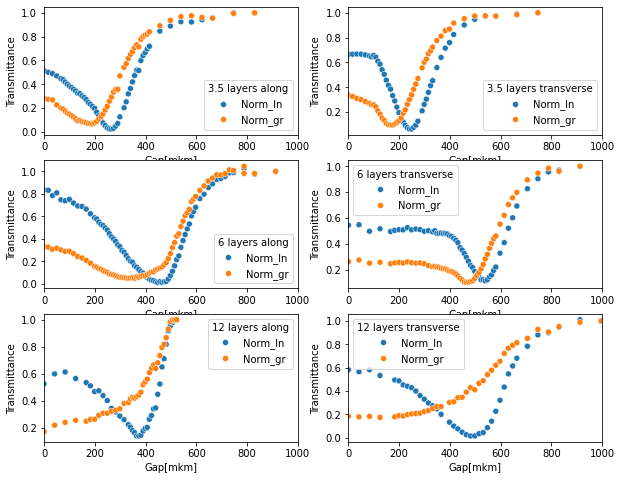

In [4]:
fig, axs = plt.subplots(3, 2, figsize=(10, 8), ) 

al_3_5_melted = data_3_5_along.melt(id_vars='Gap', value_vars=['Norm_In', 'Norm_gr'],var_name='3.5 layers along', value_name='Transmittance')
sns.scatterplot(data = al_3_5_melted, x="Gap", y="Transmittance", hue="3.5 layers along", ax=axs[0, 0])
tr_3_5_melted = data_3_5_trans.melt(id_vars='Gap', value_vars=['Norm_In', 'Norm_gr'],var_name='3.5 layers transverse', value_name='Transmittance')
sns.scatterplot(data = tr_3_5_melted, x="Gap", y="Transmittance", hue="3.5 layers transverse", ax=axs[0, 1])
al_6_melted = data_6_along.melt(id_vars='Gap', value_vars=['Norm_In', 'Norm_gr'],var_name='6 layers along', value_name='Transmittance')
sns.scatterplot(data = al_6_melted, x="Gap", y="Transmittance", hue="6 layers along", ax=axs[1, 0])
tr_6_melted = data_6_trans.melt(id_vars='Gap', value_vars=['Norm_In', 'Norm_gr'],var_name='6 layers transverse', value_name='Transmittance')
sns.scatterplot(data = tr_6_melted, x="Gap", y="Transmittance", hue="6 layers transverse", ax=axs[1, 1])
al_12_melted = data_12_along.melt(id_vars='Gap', value_vars=['Norm_In', 'Norm_gr'],var_name='12 layers along', value_name='Transmittance')
sns.scatterplot(data = al_12_melted, x="Gap", y="Transmittance", hue="12 layers along", ax=axs[2, 0])
tr_12_melted = data_12_trans.melt(id_vars='Gap', value_vars=['Norm_In', 'Norm_gr'],var_name='12 layers transverse', value_name='Transmittance')
sns.scatterplot(data = tr_12_melted, x="Gap", y="Transmittance", hue="12 layers transverse", ax=axs[2, 1])

for ax in plt.gcf().axes:
    ax.set_xlim(0, 1000)
    ax.set_xlabel("Gap[mkm]")

plt.show()

# изменить ось x


In [5]:
""" define reflect3 by V.V.'s code
d_2 - air gap, teta - internal incidence angle, eps_3 - permittivity of 3rd medium (InSb)"""

def reflect3(d_2, teta, eps3_re, eps3_im, wavelength = 197 * 10**(-6)):

    n_1 = 1.531 - 1j * 0.002  # Complex refractive index of the prism (Zeonex)
    eps_1 = n_1**2  # Dielectric permittivity of the prism (Zeonex)       
    eps_2 = 1  # Dielectric permittivity of air
    eps_3 = eps3_re + eps3_im*1j
    
    # Normal components of wave vectors (normalized by k0)
    kz_1 = np.sqrt(eps_1) * np.cos(teta)
    kz_2 = np.sqrt(eps_2 - eps_1 * np.sin(teta)**2)
    kz_3 = np.sqrt(eps_3 - eps_1 * np.sin(teta)**2)

    # Reflection coefficients
    r_12 = (eps_2 * kz_1 - eps_1 * kz_2) / (eps_2 * kz_1 + eps_1 * kz_2)
    r_23 = (eps_3 * kz_2 - eps_2 * kz_3) / (eps_3 * kz_2 + eps_2 * kz_3)

    # Transmission coefficients
    t_12 = 2 * kz_1 * np.sqrt(eps_1 * eps_2) / (eps_2 * kz_1 + eps_1 * kz_2)
    t_23 = 2 * kz_2 * np.sqrt(eps_2 * eps_3) / (eps_3 * kz_2 + eps_2 * kz_3)

    # Transformation matrix
    S1 = np.array([[1 / t_12, r_12 / t_12], [r_12 / t_12, 1 / t_12]])

    R = np.zeros(len(d_2))  # Initialize reflection coefficient array

    for j in range(len(d_2)):
        S2 = np.array([[np.exp(-1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23,
                        r_23 * np.exp(-1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23],
                    [r_23 * np.exp(1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23,
                        np.exp(1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23]], dtype=np.complex128)
        
        S = np.dot(S1, S2)
        R[j] = (np.abs(S[1, 0] / S[0, 0]))**2

    return R

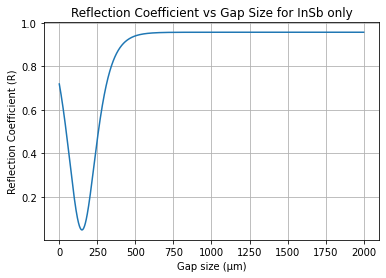

In [6]:
# Vizualize reflect3

d_2 = np.arange(0, 2000 * 10**(-6), 1 * 10**(-6))  # Gap size between the prism and InSb
teta = 0.7334459774574046
eps3_re, eps3_im = (-16.999358675469676, 7.112859392867092)
params = [d_2, teta, eps3_re, eps3_im]
R = reflect3(*params)

# Plot the results
plt.plot(d_2 * 10**6, R)  # Convert d_2 to micrometers for plotting
plt.xlabel('Gap size (µm)')
plt.ylabel('Reflection Coefficient (R)')
plt.title('Reflection Coefficient vs Gap Size for InSb only')
plt.grid()
plt.show()

In [40]:
# define reflect4 by V.V.'s code
# teta - internal incidence angle,  d_2 - gap, d_3 - Gr, eps_re/im - gr

def reflect4(d_2, d_3, teta, eps3_re, eps3_im, eps4_re, eps4_im, wavelength = 197 * 10**(-6)): 
    
    n_1 = 1.531 - 1j * 0.002  # Complex refractive index of the prism (Zeonex)
    eps_1 = n_1**2  # Dielectric permittivity of the prism (Zeonex)
    eps_2 = 1  #Dielectric permittivity of air"
    eps_3 = eps3_re+eps3_im*1j
    eps_4 = eps4_re+eps4_im*1j

    # Normal components of wave vectors (normalized by k0)
    kz_1 = np.sqrt(eps_1) * np.cos(teta)
    kz_2 = np.sqrt(eps_2 - eps_1 * np.sin(teta)**2)
    kz_3 = np.sqrt(eps_3 - eps_1 * np.sin(teta)**2)
    kz_4 = np.sqrt(eps_4 - eps_1 * np.sin(teta)**2)

    # Reflection coefficients
    r_12 = (eps_2 * kz_1 - eps_1 * kz_2) / (eps_2 * kz_1 + eps_1 * kz_2)
    r_23 = (eps_3 * kz_2 - eps_2 * kz_3) / (eps_3 * kz_2 + eps_2 * kz_3)
    r_34 = (eps_4 * kz_3 - eps_3 * kz_4) / (eps_4 * kz_3 + eps_3 * kz_4)

    # Transmission coefficients
    t_12 = 2 * kz_1 * np.sqrt(eps_1 * eps_2) / (eps_2 * kz_1 + eps_1 * kz_2)
    t_23 = 2 * kz_2 * np.sqrt(eps_2 * eps_3) / (eps_3 * kz_2 + eps_2 * kz_3)
    t_34 = 2 * kz_3 * np.sqrt(eps_3 * eps_4) / (eps_4 * kz_3 + eps_3 * kz_4)

    # Transformation matrices
    S1 = np.array([[1 / t_12, r_12 / t_12], [r_12 / t_12, 1 / t_12]])
    S3 = np.array([[np.exp(-1j * (2 * np.pi / wavelength) * kz_3 * d_3) / t_34,
                    r_34 * np.exp(-1j * (2 * np.pi / wavelength) * kz_3 * d_3) / t_34],
                    [r_34 * np.exp(1j * (2 * np.pi / wavelength) * kz_3 * d_3) / t_34,
                    np.exp(1j * (2 * np.pi / wavelength) * kz_3 * d_3) / t_34]])

    R = np.zeros(len(d_2))  # Initialize reflection coefficient array

    for j in range(len(d_2)):
        S2 = np.array([[np.exp(-1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23,
                        r_23 * np.exp(-1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23],
                        [r_23 * np.exp(1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23,
                        np.exp(1j * (2 * np.pi / wavelength) * kz_2 * d_2[j]) / t_23]], dtype=np.complex128)
        
        S = S1 @ S2 @ S3  # Matrix multiplication
        R[j] = (np.abs(S[1, 0] / S[0, 0]))**2
    
    return R


   

In [ ]:
# Visualize reflect4
@widgets.interact(teta = '0.8672', gr_thickness = '35e-6', eps3_re = '-100', eps3_im = '100', eps4_re = '-17', eps4_im = '7')
def visualize_reflect4(teta, gr_thickness, eps3_re, eps3_im, eps4_re, eps4_im):
    teta = float(teta)
    gr_thickness = float(gr_thickness)
    eps3_re, eps3_im = (float(eps3_re), float(eps3_im))
    eps4_re, eps4_im = (float(eps4_re), float(eps4_im))

    d_2 = np.arange(0, 450e-6, 1e-6)  # Gap size between the prism and InSb (microns)
    

    # Dielectric permittivity of the thin dielectric layer on InSb
    
    R3 = reflect3(d_2, teta, eps4_re, eps4_im)
    R4 = reflect4(d_2, gr_thickness, teta, eps3_re, eps3_im, eps4_re, eps4_im)

    # Plot the results
    plt.plot(d_2 * 1e6, R3, color = 'red')
    plt.plot(d_2 * 1e6, R4, color = 'green')  # Convert d_2 to micrometers for plotting
    plt.xlabel('Gap size (µm)')
    plt.ylabel('Reflection Coefficient (R)')
    plt.title('Reflection Coefficient vs Gap Size for InSb+Graphene')
    plt.grid()
    plt.show()

interactive(children=(Text(value='0.8672', description='teta'), Text(value='35e-6', description='gr_thickness'…

[(0.7, 4.9999999999999996e-05), (0.7000100010000999, 5.454545454545454e-05), (0.7000200020002, 5.909090909090908e-05), (0.7000300030002999, 6.363636363636363e-05), (0.7000400040004, 6.818181818181817e-05), (0.7000500050005, 7.272727272727273e-05), (0.7000600060006, 7.727272727272727e-05), (0.7000700070007, 8.181818181818182e-05), (0.7000800080008001, 8.636363636363636e-05), (0.7000900090009, 9.09090909090909e-05), (0.7001000100010001, 9.545454545454545e-05), (0.7001100110011, 9.999999999999999e-05), (0.7001200120012001, 0.00010454545454545455), (0.7001300130013001, 0.00010909090909090908), (0.7001400140014001, 0.00011363636363636364), (0.7001500150015001, 0.00011818181818181818), (0.7001600160016002, 0.00012272727272727272), (0.7001700170017001, 0.00012727272727272728), (0.7001800180018002, 0.0001318181818181818), (0.7001900190019001, 0.00013636363636363634), (0.7002000200020001, 0.0001409090909090909), (0.7002100210021002, 0.00014545454545454546), (0.7002200220022001, 0.00015000000000

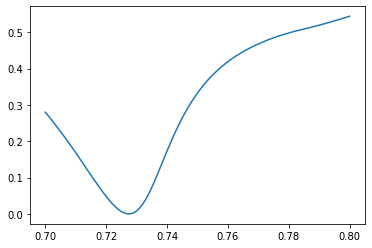

In [9]:
# Найдём тета истинного резонанса (провал до нуля), потом попробуем нарисовать на интерактивном графике

def plot_angle():
    def angle_function_In(x, angle):
        return reflect3(x, angle, -17, 7, wavelength=197e-6)

    angle = np.linspace(0.7, 0.8, 10000)
    gap = np.linspace(50*1e-6, 500*1e-6, 100 )
    R_min = np.array([np.min(angle_function_In(gap, angles)) for angles in angle])
    


    plt.plot(angle, R_min)
    print(list(zip(angle, gap)))


plot_angle()



### How to shift

1. In
Norm_In = Norm_In(Gap)

1) f_func[i](x, shift, angle[i]) = reflect(x - shift[i]), i - dataframe index  -  Shifted theory reflection function
2) fitting:  {Norm_In(Gap)) :    f_func[shift, angle](Gap)
3) plot with erased shift
a) theory: 
plot(gap*1e6, fitting_function_In(gap+fitted_shift, fitted_shift, fitted_angle))
which is equal to: plot(Gap*1e6, reflect(Gap, angle[i])), 
example: 0-> reflect(0)

b) shifted exper: scatterplot((Gap - fitted_shift)*1e6 -> Norm_In(Gap))  ; also remove negative values 

example:  0 -> NormIn(Gap = shift)

2. Gr









In [ ]:
# Подгонка угла, сдвига по InSb, д.п. InSb = -17+7j по умолчанию, но можно менять интерактивно (подгонка д.п. InSb см. report №1)




@widgets.interact(left_num_In = 3, right_num_In = 12, rel_sigma = 0.05, re_InSb_tab = -17, im_InSb_tab = 7, 
                  shift_low='1.742e-04', shift_high = '1.744e-04', angle_low = '7.35759925e-01', angle_high = '7.45759925e-01' )
def plot_graphs(left_num_In, right_num_In, rel_sigma, re_InSb_tab, im_InSb_tab, shift_low, shift_high, angle_low, angle_high):
    
    shift_low=float(shift_low)
    shift_high = float(shift_high)
    angle_low = float(angle_low)
    angle_high = float(angle_high)

    


    # Dataframes 
    dfs = [data_3_5_along, data_3_5_trans, data_6_along, data_6_trans, data_12_along, data_12_trans]
    titles = ['data_3_5_along', 'data_3_5_trans', 'data_6_along', 'data_6_trans', 'data_12_along', 'data_12_trans']
    # толщина слоёв графена
    thickness = np.array([3.5, 3.5, 6, 6, 12, 12])*35e-9
    
    # Create a figure for subplots
    fig, axes = plt.subplots(3, 2, figsize=(15, 20))
    axes = axes.flatten()
    
    def fitting_function_In(x, fitted_shift, fitted_angle):
        return reflect3(x - np.ones(x.size, dtype=np.float64) * fitted_shift, fitted_angle, re_InSb_tab, im_InSb_tab, wavelength=197e-6)

    



    
    for i, df in enumerate(dfs):
        gap = df['Gap'].values.astype(np.float64) * 1e-6
        norm_in = df['Norm_In'].values.astype(np.float64)
        
        # Dynamic initial guesses 
        initial_guess = [(shift_low+shift_high)/2, (angle_low+angle_high)/2]

        
        # Ensure min_index and max_index are within bounds
        min_index = max(norm_in.argmin() - left_num_In, 0)
        max_index = min(norm_in.argmin() + right_num_In, len(gap))

        print(norm_in.argmin(), min_index, max_index, ';')
        
        
        try:
            x_data = gap[min_index:max_index]
            y_data = norm_in[min_index:max_index]
            y_errors = rel_sigma*norm_in[min_index:max_index]
            my_bounds = ([shift_low, angle_low], [shift_high, angle_high])
            params_In, pcov_In , infodict_In , mesg_In, ier_In = curve_fit(fitting_function_In, 
                                                            x_data, y_data, p0=initial_guess, bounds=my_bounds, 
                                                            sigma = y_errors, absolute_sigma=True, method='trf', full_output=True)
            
            y_fit = fitting_function_In(x_data, *params_In)
            fitted_shift, fitted_angle = params_In
            red_chi_square = np.sum(((y_data - y_fit) / y_errors) ** 2)/(right_num_In+left_num_In+1-len(params_In))
            print(f'[fitted_shift, fitted_angle]: {fitted_shift} {fitted_angle}, pcov_In:{pcov_In}, sigma: {np.sqrt(np.diag(pcov_In))}, mesg_In:{mesg_In} , \nier_In:{ier_In}, reduced chi square:{red_chi_square}\n')
        

        except RuntimeError as e:
            print(f"Fitting failed for Dataframe {i+1}: {e}")
            params_In = initial_guess
        
        # Validate params_In before using them in the fitting function
        if not np.any(np.isnan(params_In)) and not np.any(np.isinf(params_In)):
            # Plot the original data
            axes[i].scatter((gap - fitted_shift)*1e6, norm_in, color='blue', label='Norm_In', s=5, alpha=0.6)
            
            # Plot the fitted function
            axes[i].plot((gap - fitted_shift)*1e6, fitting_function_In(gap, fitted_shift, fitted_angle), color='red', label=f'Fitted reflect3')
        else:
            print(f"Invalid fitting parameters for Dataframe {i+1}, skipping plot.")
        
        # Set subplot title and labels
        
        axes[i].set_title(titles[i])
        axes[i].set_xlabel('Gap [mkm]')
        axes[i].set_ylabel('Reflectance')
        axes[i].legend()
    # Adjust layout and show the plot
    plt.tight_layout()

interactive(children=(IntSlider(value=3, description='left_num_In', max=9, min=-3), IntSlider(value=12, descri…

### Угол и сдвиг находится вручную по минимуму и близким точкам, считаем хи-квадрат (погрешность - 0.05)
### Неплохо бы обосновать процедуру выбора точек
GPT:  


Degrees of Freedom: This is calculated as the number of data points minus the number of parameters estimated in the model.

A value of χ²_(red) ≈ 1 suggests a good fit, while values significantly greater than 1 may indicate that the model does not fit the data well.

In general, a lower chi-square value indicates a better fit of the model to the data. However, to evaluate whether a chi-square value is acceptable or optimal, you typically compare it to the degrees of freedom (df) of your model:

Goodness-of-Fit Tests: Additionally, you can use statistical tests (like the chi-square goodness-of-fit test) to determine if your chi-square value is statistically significant compared to a critical value from the chi-square distribution for your degrees of freedom.

In summary, there is no single "optimal" chi-square value; instead, you should aim for a reduced chi-square close to 1 and consider other diagnostic measures (like residuals and visualizations) to assess model fit.






3.5 along
28 25 40 ;
[shift, angle]: 0.00011896489348631966 0.7230737459726524, pcov_In:[[ 1.01304055e-13 -1.03822582e-11]
 [-1.03822582e-11  5.75908992e-09]], sigma: [3.18282980e-07 7.58886679e-05], mesg_In:`xtol` termination condition is satisfied. , 
 ier_In:3, reduced chi square:4.299263501246354

3.5 trans:

24 21 36 ;
[shift, angle]: 9.700000000000001e-05 0.7342699249999999, pcov_In:[[4.75914050e-13 1.51478850e-11]
 [1.51478850e-11 7.47523558e-09]], sigma: [6.89865240e-07 8.64594447e-05], mesg_In:`gtol` termination condition is satisfied. , 
 ier_In:1, reduced chi square:6.653993376630582


6 along:
42 39 54 ;
[shift, angle]: 0.00031200000000000005 0.7264626647693478, pcov_In:[[ 2.58033707e-14 -1.12019925e-11]
 [-1.12019925e-11  1.30003392e-08]], sigma: [1.60634276e-07 1.14019030e-04], mesg_In:`ftol` termination condition is satisfied. , 
 ier_In:2, reduced chi square:282.4850790128894


shifts = np.array([0.000118964, 9.70000e-5, 0.000312, 0.0004080, 0.00023420, 0.00034412])
angles = np.array([0.723073, 0.734269, 0.7264626, 0.715108, 0.738664470, 0.7280000])


6 trans:
39 36 51 ;
[shift, angle]: 0.00040800000006976044 0.715108447896622, pcov_In:[[ 6.06162301e-13 -6.92594494e-11]
 [-6.92594494e-11  3.48587462e-08]], sigma: [7.78564256e-07 1.86704971e-04], mesg_In:`xtol` termination condition is satisfied. , 
 ier_In:3, reduced chi square:2.737866706759637

12 along:

19 16 23 ;
[shift, angle]: 0.00023420000000467993 0.738664470742743, pcov_In:[[3.71728912e-12 8.85575337e-11]
 [8.85575337e-11 2.17865194e-08]], sigma: [1.92802726e-06 1.47602572e-04], mesg_In:`xtol` termination condition is satisfied. , 
 ier_In:3, reduced chi square:1.0975064627008828

12 trans:

21 18 24 ;
[shift, angle]: 0.00034412810000000006 0.7280000000000001, pcov_In:[[ 8.50975684e-14 -8.24917888e-11]
 [-8.24917888e-11  1.24385293e-07]], sigma: [2.91714875e-07 3.52682993e-04], mesg_In:`gtol` termination condition is satisfied. , 
 ier_In:1, reduced chi square:1128.7845094026875





interactive(children=(IntSlider(value=3, description='left_num_gr', max=9, min=-3), IntSlider(value=12, descri…

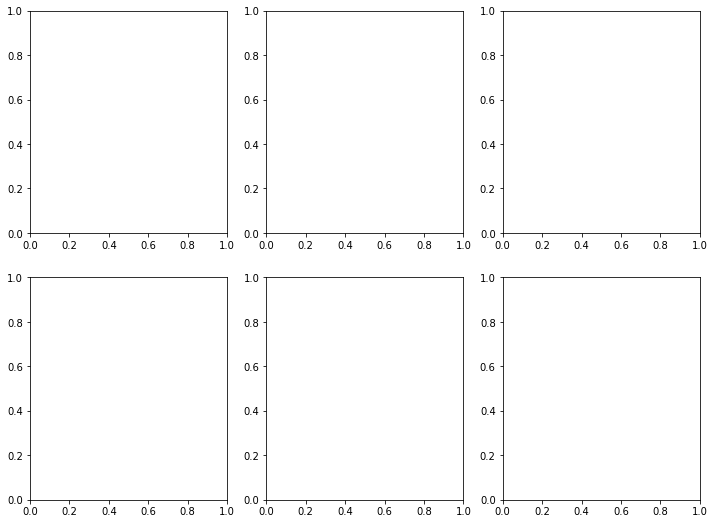

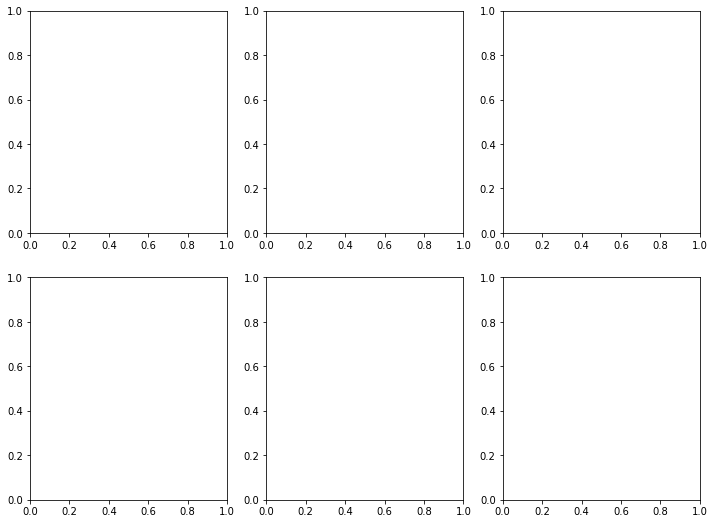

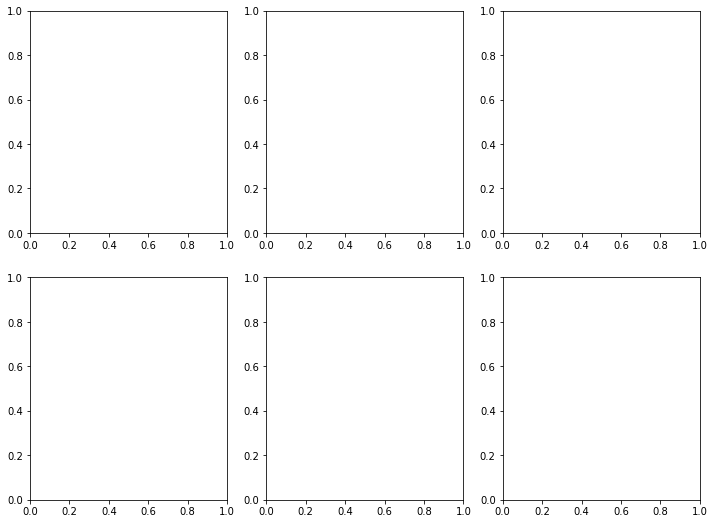

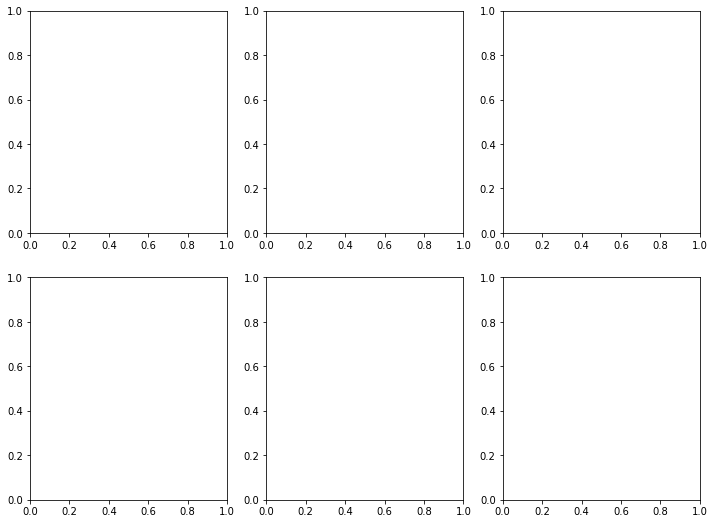

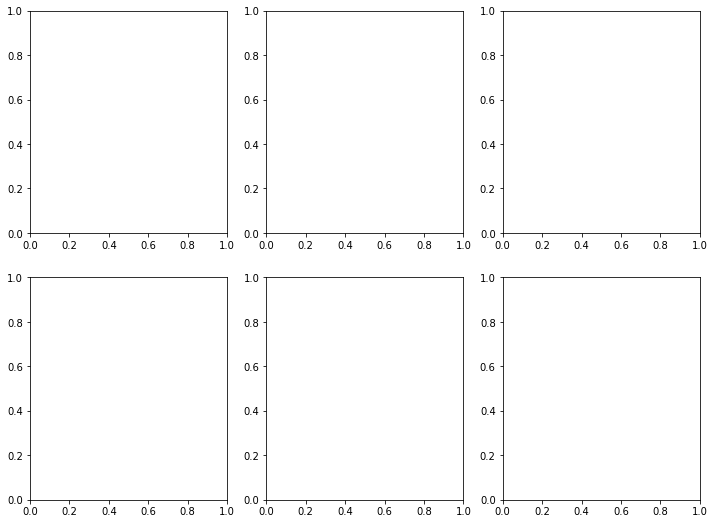

...

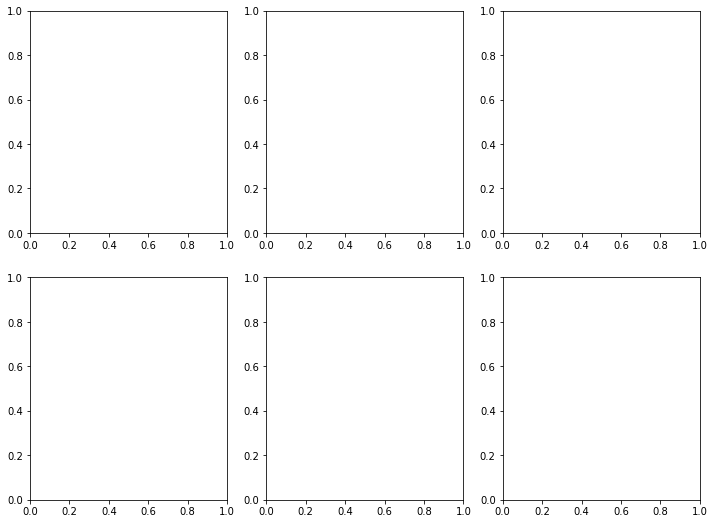

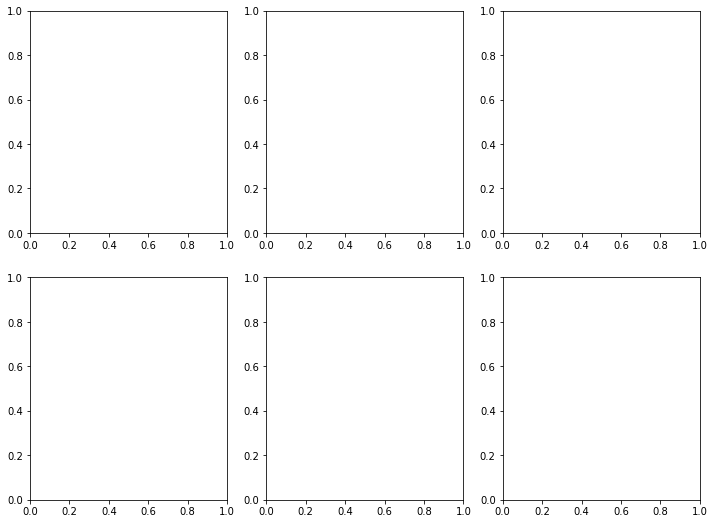

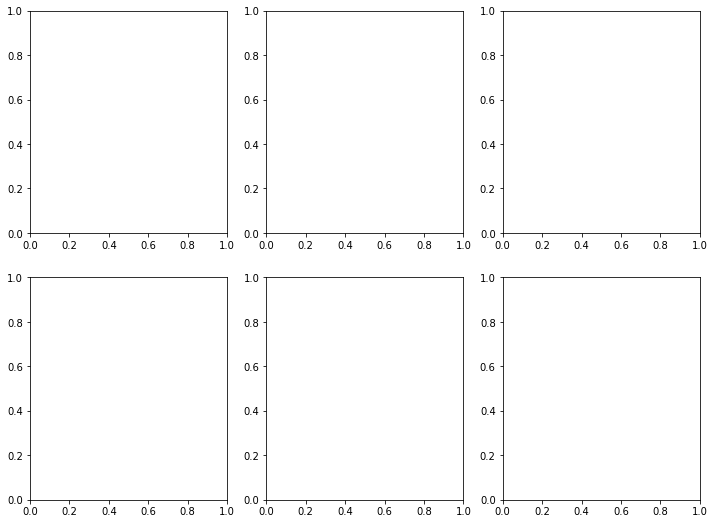

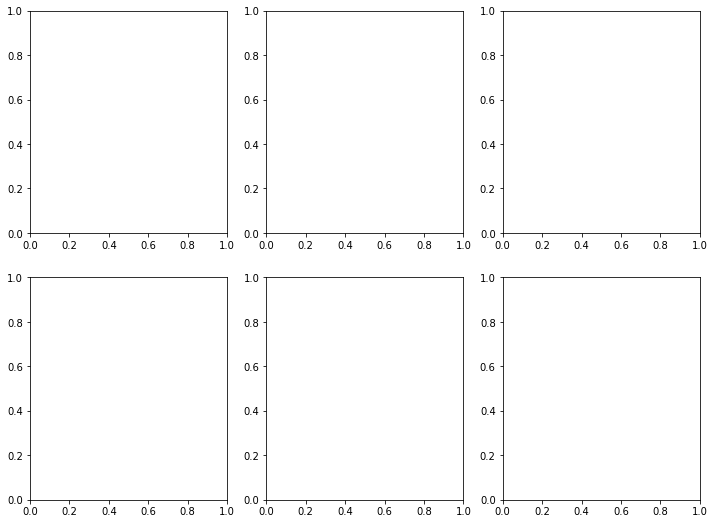

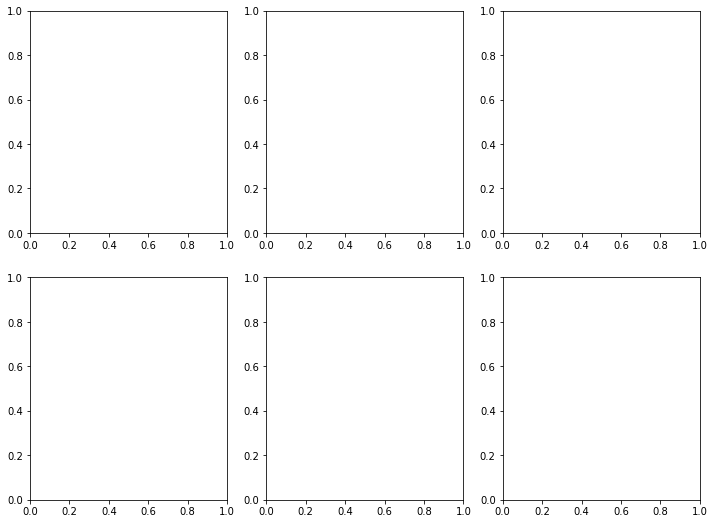

In [ ]:
# Fitting permittivity of graphene

# угол и сдвиг из предыдущей подгонки по кривой InSb


@widgets.interact(left_num_gr = 3, right_num_gr = 12, rel_sigma = 0.05, re_InSb_tab = -17, im_InSb_tab = 7, 
                  re_Gr_low ='-300', re_Gr_high = '-100', im_Gr_low = '100',  im_Gr_high = '200', angle = '0.7231')
def plot_graphs_in(left_num_gr, right_num_gr, rel_sigma, re_InSb_tab, im_InSb_tab, re_Gr_low, re_Gr_high, im_Gr_low,  im_Gr_high, angle):    

    #angles = np.ones(6)*float(angle)

    re_Gr_low, re_Gr_high, im_Gr_low, im_Gr_high =  (float(re_Gr_low), float(re_Gr_high), float(im_Gr_low), float(im_Gr_high))

    # Dataframes 
    dfs = [data_3_5_along, data_3_5_trans, data_6_along, data_6_trans, data_12_along, data_12_trans]

    


    # толщина слоёв
    thickness = np.array([3.5, 3.5, 6, 6, 12, 12])*35e-9
    shifts = np.array([0.000118964, 9.70000e-5, 0.000312, 0.0004080, 0.00023420, 0.00034412])
    angles = np.array([0.723073, 0.734269, 0.7264626, 0.715108, 0.738664470, 0.7280000])

    

    # Create a figure for subplots
    fig, axes = plt.subplots(2, 3, figsize=(12, 9))
    axes = axes.flatten()



    for i, df in enumerate(dfs):

        gap = df['Gap'].values.astype(np.float64) * 1e-6
        #print(gap, '\n')
        norm_gr = df['Norm_gr'].values.astype(np.float64)
        #print(norm_gr)

        def fitting_function_gr(x, eps3_re, eps3_im):
            return reflect4(x - shifts[i], d_3 = thickness[i], 
                            teta = angles[i], eps3_re=eps3_re, eps3_im=eps3_im, eps4_re=re_InSb_tab, eps4_im=im_InSb_tab)
        



        # Dynamic initial guesses based on data statistics
        initial_guess = [(re_Gr_low+re_Gr_high)/2, (im_Gr_low+im_Gr_high)/2]
        my_bounds = ([re_Gr_low, im_Gr_low], [re_Gr_high, im_Gr_high])



        # Ensure min_index and max_index are within bounds
        min_index = max(norm_gr.argmin() - left_num_gr, 0)
        max_index = min(norm_gr.argmin() + right_num_gr, len(gap))
    
        x_data = gap[min_index:max_index]
        y_data = norm_gr[min_index:max_index]
        y_errors = rel_sigma*norm_gr[min_index:max_index]

        try:
            params, pcov , infodict , mesg , ier = curve_fit(fitting_function_gr, 
                                                             x_data, y_data, 
                                                             p0=initial_guess, bounds=my_bounds, method='trf', full_output=True, 
                                                             sigma = y_errors, absolute_sigma=True)  
            
            fitted_values = fitting_function_gr(x_data, *params)
            red_chi_square = np.sum(((y_data - fitted_values) / y_errors) ** 2)/(right_num_gr+left_num_gr+1-len(params))

            print(f'[Re Gr, Im Gr]: {params} , pcov_gr:{pcov}, sigma: {np.sqrt(np.diag(pcov))}, mesg_In:{mesg} , \n ier_In:{ier}, reduced chi square:{red_chi_square}\n') 
        except RuntimeError as e:
            print(f"Fitting failed for Dataframe {i+1}: {e}")
            params = initial_guess

        # Validate params before using them in the fitting function
        if not np.any(np.isnan(params)) and not np.any(np.isinf(params)):
            # Plot the original data

            #Учёт сдвига

            axes[i].scatter((gap -shifts[i])*1e6, norm_gr, color='green', label='Fitted graphene with shift', s=5, alpha=0.6)

            # Plot the fitted function

            #Функция учитывает сдвиг
            fitted_values = fitting_function_gr(gap, *params)
            if not np.any(np.isnan(fitted_values)) and not np.any(np.isinf(fitted_values)):
                #axes[i].plot(gap*1e6, fitting_function_gr(gap+shifts[i], *params), color='red')
            #                label = 'fitting' 
                axes[i].step((gap-shifts[i])*1e6, fitting_function_gr(gap, *params), where = 'pre', label = 'vert_first')
                            
            else:
                print(f"Invalid fitted values for Dataframe {i+1}, skipping plot.")
        else:
            print(f"Invalid fitting parameters for Dataframe {i+1}, skipping plot.")

        # Set subplot title and labels
        titles = ['data_3_5_along', 'data_3_5_trans', 'data_6_along','data_6_trans', 'data_12_along', 'data_12_trans']
        axes[i].set_title(titles[i])
        axes[i].set_xlabel('Gap [mkm]')
        axes[i].set_ylabel('Value')
        axes[i].legend()



    # Adjust layout and show the plot



    plt.tight_layout()
    plt.show()  




Output for Graphene

[ 7.59362718e-05 -1.73652126e+01  1.54573263e+01] [[2.59352829e-02 7.33066619e+03 4.91923588e+03]
 [7.33066619e+03 2.07202933e+09 1.39043311e+09]
 [4.91923588e+03 1.39043311e+09 9.33048685e+08]] {'nfev': 22, 'fvec': array([ 0.05229159,  0.02730576,  0.00733751, -0.00177501, -0.01267923,
       -0.01116214, -0.01585139, -0.01552167, -0.01615583, -0.01127607,
       -0.00370039, -0.00059034,  0.00589332,  0.00262213,  0.00923649,
        0.01003882,  0.03005525,  0.06952173, -0.00380896, -0.00192459,
        0.00252801, -0.00985361, -0.01425843, -0.00934129, -0.01737556])} `xtol` termination condition is satisfied. 3
[ 4.25775050e-05 -2.12250555e+01  1.64058107e+01] [[1.25365843e-02 3.21931646e+03 2.80787185e+03]
 [3.21931646e+03 8.26700332e+08 7.21043930e+08]
 [2.80787185e+03 7.21043930e+08 6.28890940e+08]] {'nfev': 20, 'fvec': array([-0.02315103, -0.02325791, -0.01380996, -0.01230637, -0.01239795,
       -0.00568362, -0.0022581 ,  0.00378557,  0.01213028,  0.01999438,
        0.01338555,  0.02085058,  0.01390228,  0.01272569,  0.01552649,
        0.00913512,  0.00667343, -0.00063829, -0.01440939, -0.0265432 ,
       -0.02033539, -0.03504897, -0.02999889, -0.03588226, -0.04336887])} `xtol` termination condition is satisfied. 3
[ 3.15980176e-04 -2.62487872e-01  1.65719688e+01] [[1.17829890e+00 3.72083393e+05 2.12363172e+04]
 [3.72083393e+05 1.17496546e+11 6.70600723e+09]
 [2.12363172e+04 6.70600723e+09 3.82739233e+08]] {'nfev': 18, 'fvec': array([ 0.31454186,  0.27340489,  0.22653165,  0.18442761,  0.14421596,
        0.10639081,  0.06840841,  0.03471327,  0.01489626, -0.0138309 ,
       -0.01986846, -0.02807296, -0.02945204, -0.01135762, -0.00299288,
        0.01332764,  0.03607787,  0.07269322,  0.09528935,  0.13101791,
        0.16412761,  0.19972205,  0.22599972,  0.24660709,  0.25171041])} `ftol` termination condition is satisfied. 2
[ 3.70863925e-04 -1.20572135e+01  1.92281597e+01] [[3.08330941e-03 8.86461706e+02 4.10513890e+02]
 [8.86461706e+02 2.54860687e+08 1.18024108e+08]
 [4.10513890e+02 1.18024108e+08 5.46560958e+07]] {'nfev': 30, 'fvec': array([ 0.01471383,  0.0010112 , -0.00509819, -0.01155057, -0.00819774,
       -0.00933923, -0.01124167, -0.00892202, -0.00238645,  0.00064884,
        0.00045429,  0.0069914 ,  0.01175907,  0.01281741,  0.00734155,
        0.00981536,  0.00242355,  0.00207002,  0.00518737,  0.02174302,
       -0.00078658, -0.00595041, -0.03410087, -0.03848992, -0.03972996])} `xtol` termination condition is satisfied. 3
[ 9.08769658e-05 -1.47915856e+01  2.19336732e+01] [[1.20480373e-01 3.46017356e+04 1.90214378e+04]
 [3.46017356e+04 9.93755314e+09 5.46292099e+09]
 [1.90214378e+04 5.46292099e+09 3.00310410e+09]] {'nfev': 21, 'fvec': array([ 0.64732577,  0.47295517,  0.28579123,  0.08637141, -0.04917005,
       -0.09226727, -0.10121303, -0.11716258, -0.09984836, -0.0511567 ,
       -0.00622396,  0.05251959,  0.11031623,  0.13671901,  0.19320394,
        0.19368189,  0.20904292,  0.24150535,  0.25370996,  0.26606207])} `ftol` termination condition is satisfied. 2
[ 1.50921556e-04 -1.52573030e+01  1.87554441e+01] [[2.89455689e-01 7.05106294e+04 3.96008492e+04]
 [7.05106294e+04 1.71762002e+10 9.64666062e+09]
 [3.96008492e+04 9.64666062e+09 5.41784924e+09]] {'nfev': 34, 'fvec': array([ 7.58989065e-01,  6.97226636e-01,  5.89553271e-01,  4.51534070e-01,
        1.82788258e-01,  9.73188548e-02,  3.52530325e-02, -2.89399171e-02,
       -6.61407364e-02, -7.83506515e-02, -6.72741820e-02, -4.50028390e-02,
       -2.96680973e-04,  4.69913700e-02,  1.01528572e-01,  1.73025512e-01,
        2.72218574e-01,  3.25522114e-01,  3.41651710e-01,  3.83088290e-01,
        3.76483266e-01,  3.70302671e-01,  4.15567889e-01])} `xtol` termination condition is satisfied. 3


In [12]:

        # Plot Re, Im vs thickness
        re_fit_vec[i] = params[1]
        im_fit_vec[i] = params[2]

NameError: name 're_fit_vec' is not defined

In [ ]:
thickness_ax = np.concatenate((np.array([0.5, 1])*35e-9, thickness[[0, 2, 4]]))*1e9
print(thickness_ax)
re_al_ax = np.concatenate([[256, -15], re_fit_vec[[0, 2, 4]]])
im_al_ax = np.concatenate([[268, 700], im_fit_vec[[0, 2, 4]]])
re_tr_ax = np.concatenate([[367, -15], re_fit_vec[[1, 3, 5]]])
im_tr_ax = np.concatenate([[465, 700], im_fit_vec[[1, 3, 5]]])
print(re_al_ax)

[ 17.5  35.  122.5 210.  420. ]
[ 256.          -15.         -115.12837619  -42.80687833  -69.6968218 ]


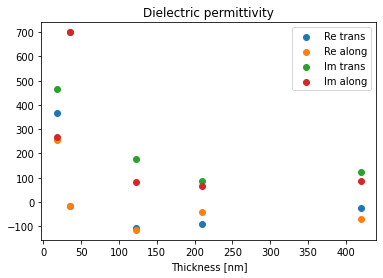

In [ ]:
# Plot Re, Im vs thickness

plt.scatter(thickness_ax, re_tr_ax, label = 'Re trans')
plt.scatter(thickness_ax, re_al_ax, label = 'Re along')
plt.scatter(thickness_ax, im_tr_ax, label = 'Im trans')
plt.scatter(thickness_ax, im_al_ax, label = 'Im along')

plt.xlabel('Thickness [nm]')
plt.title('Dielectric permittivity')
plt.legend()
plt.show()

In [ ]:
print(thickness_ax)
print(re_tr_ax)
print(re_al_ax)
print(im_tr_ax)
print(im_al_ax)
perm_to_csv = pd.DataFrame(np.array((thickness_ax, re_tr_ax, im_tr_ax, re_al_ax, im_al_ax)))
perm_to_csv.to_csv(sep = ';', decimal=',', lineterminator=' ')

[ 17.5  35.  122.5 210.  420. ]
[ 367.          -15.         -106.06497879  -89.70401155  -25.52513442]
[ 256.          -15.         -115.12837619  -42.80687833  -69.6968218 ]
[465.         700.         175.56703178  85.14965219 122.05264105]
[268.         700.          84.04457708  65.37145437  85.40609104]


';0;1;2;3;4 0;17,5;35,0;122,50000000000001;210,0;420,0 1;367,0;-15,0;-106,06497879326211;-89,70401155298795;-25,525134416450737 2;465,0;700,0;175,56703178256726;85,14965218899137;122,0526410470918 3;256,0;-15,0;-115,12837618603318;-42,80687832819221;-69,69682180163046 4;268,0;700,0;84,04457707860017;65,37145436936585;85,40609103580088 '

Попробуем разобраться с погрешностями $\epsilon$

Создадим тестовые данные с гауссовым шумом  

In [ ]:
thickness = np.array([3.5, 3.5, 6, 6, 12, 12])*35e-9
def create_data(x, shift, eps3_re, eps3_im):
        return reflect4(x - np.ones(x.size, dtype=np.float64) * shift, d_3 = thickness[i], 
          teta = 7.28050201e-01, eps3_re=eps3_re, eps3_im=eps3_im, eps4_re=-7, eps4_im=17)
_d = np.linspace(0, 1000*1e-6, 1000) 
data_noise = create_data(_d, 1e-4, -100, 170)+np.random.normal(0, 0, 1000)

__params, __pcov , infodict , mesg, ier = curve_fit(create_data, 
                                                        _d, data_noise, 
          p0=[1e-4, -95, 173], bounds = ([0.5*1e-4, -110, 160], [1.5e-4, -90, 180]),
 method='trf', full_output=True)
plt.plot(_d, data_noise)
plt.plot(_d, create_data(_d, *__params))
_diff = create_data(_d, 1.2e-4, -100, 171) -  create_data(_d, 1e-4, -100, 171)

#print(_diff)


NameError: name 'i' is not defined

Мы видим, что даже без шума регрессия работает плохо
Следующий шаг - аналитически посчитать якобианы матриц S2

In [ ]:
help(curve_fit)

Help on function curve_fit in module scipy.optimize._minpack_py:

curve_fit(f, xdata, ydata, p0=None, sigma=None, absolute_sigma=False, check_finite=True, bounds=(-inf, inf), method=None, jac=None, *, full_output=False, **kwargs)
    Use non-linear least squares to fit a function, f, to data.
    
    Assumes ``ydata = f(xdata, *params) + eps``.
    
    Parameters
    ----------
    f : callable
        The model function, f(x, ...). It must take the independent
        variable as the first argument and the parameters to fit as
        separate remaining arguments.
    xdata : array_like or object
        The independent variable where the data is measured.
        Should usually be an M-length sequence or an (k,M)-shaped array for
        functions with k predictors, but can actually be any object.
    ydata : array_like
        The dependent data, a length M array - nominally ``f(xdata, ...)``.
    p0 : array_like, optional
        Initial guess for the parameters (length N). If No

In [ ]:

from Functions.reflect import reflect_n




(-0.745474103616478+0.018757066886641673j)
kz[1.13375744-1.47775826e-03j 0.005881  +2.33732400e-01j
 0.80947505+4.32548796e+00j]
 r[ 0.60961065-0.76667712j -0.87656871+8.5396671j ]
 t[2.46070429-1.17600079j 1.95936725+0.35826733j]
 Pr[[[2.10706963-0.03952708j 0.        +0.j        ]
  [0.        +0.j         0.47442581+0.00889988j]]]
 Rfr[[[0.33082682+0.1581062j  0.32289196-0.15725413j]
  [0.32289196-0.15725413j 0.33082682+0.1581062j ]]

 [[0.49385743-0.09030108j 0.33824122+4.29653314j]
  [0.33824122+4.29653314j 0.49385743-0.09030108j]]]

S2[[1.03702265-0.20979141j 0.88252721+9.0397248j ]
 [0.12223173+2.04139652j 0.23510238-0.03844589j]]
S[[ 0.73672992+0.73448417j -1.06740598+3.08073178j]
 [ 0.0195358 +0.46385826j  1.79035173+2.80452563j]]
0.19916704551829584
[0.00000000e+00 1.00100100e-06 2.00200200e-06 3.00300300e-06
 4.00400400e-06 5.00500501e-06 6.00600601e-06 7.00700701e-06
 8.00800801e-06 9.00900901e-06 1.00100100e-05 1.10110110e-05
 1.20120120e-05 1.30130130e-05 1.40140140e-05 1

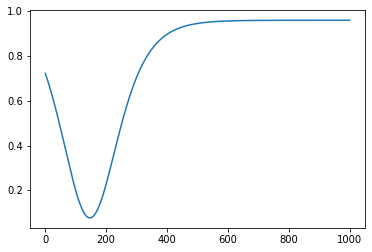

In [ ]:
eps_re = np.array([2.34, 1, -17])
eps_im = np.array([-0.0061, 0, 7])

teta = 0.736

_gap = np.linspace(0, 1000*1e-6, 1000)

print(reflect_n(3, teta, np.array([100*1e-6]), eps_re, eps_im))
print(_gap)

_R = []
def part_reflect_n(d):
    return reflect_n(3, 0.736, d, eps_re, eps_im)

for _gaps in _gap:
    
    _R = _R+[part_reflect_n(np.array([_gaps]))]
    print([_gaps, _R])
print(_R)

plt.plot(_gap*10**6, np.array(_R))

plt.show()


In [ ]:
a = np.array([[1, 2], [np.nan, 3]])
print(np.isnan(a))
np.any(np.isnan(a))

[[False False]
 [ True False]]


True

In [ ]:
_R = np.array([])
def part_reflect_n(d):
    return reflect_n()

for gaps in gap:
    _R.append(reflect_n(gaps)) 


def g(a): return len(a) 

def f(b):
    def h(j):
        return np.vectorize(g)
    return h(b)

a = np.array([i for i in range(4)])
b = np.array([[i for i in range(4)]])
print(b)
print(g(a))
print(f(b))




In [ ]:
number = 4
e = [sy.Symbol(f'e{i}') for i in range(number)]
teta, wl = sy.symbols('\u03F4 \u03BB')
S = sy.Matrix([[wl, wl],  [wl, wl]])
R = S[0, 0]
R**2



λ**2

In [ ]:

eps = [sy.Symbol(f'\u03B5{i}') for i in range(number)]
kz = [sy.Symbol(f'kz{i}') for i in range(number)]
r = [sy.Symbol(f'r{i}{i+1}') for i in range(number-1)]
t = [sy.Symbol(f't{i}{i+1}') for i in range(number-1)]
thickness = [sy.Symbol(f'd{i+1}') for i in range(number-2)]
teta, wavelength, j1 = sy.symbols('\u03F4 \u03BB i')
print(eps, kz, r, t, thickness, teta, wavelength, j1)

[ε0, ε1, ε2, ε3] [kz0, kz1, kz2, kz3] [r01, r12, r23] [t01, t12, t23] [d1, d2] ϴ λ i


Grozin: notes on sympy https://www.inp.nsk.su/~grozin/python/python1.html

In [ ]:
def r_coef(number):

    eps = [sy.Symbol(f'\u03B5{i}') for i in range(number)]
    kz = [sy.Symbol(f'kz{i}') for i in range(number)]
    r = [sy.Symbol(f'r{i}{i+1}') for i in range(number-1)]

    #wave vectors
    kz[0] = sy.sqrt(eps[0]) * sy.cos(teta)
    for i in range(number-1):
        kz[i+1] = sy.sqrt(eps[i+1] - eps[0] * sy.sin(teta)**2)

    
    # Fresnel coefficients 
    r = [(eps[i+1] * kz[i] - eps[i] * kz[i+1]) / (eps[i+1] * kz[i] + eps[i] * kz[i+1]) for i in range(number-1)]
    return r


def sym_reflect_n(number):
    
    eps = [sy.Symbol(f'\u03B5{i}') for i in range(number)]
    kz = [sy.Symbol(f'kz{i}') for i in range(number)]
    r = [sy.Symbol(f'r{i}{i+1}') for i in range(number-1)]
    t = [sy.Symbol(f't{i}{i+1}') for i in range(number-1)]
    thickness = [sy.Symbol(f'd{i+1}') for i in range(number-2)]
    teta, wavelength = sy.symbols('\u03F4 \u03BB')

     


    if (number == 2):
        
        #kz[0] = eps[0] * sy.cos(teta)
        #kz[1] = sy.sqrt(eps[1]-eps[0] * sy.sin(teta))
        r = (eps[1] * kz[0] - eps[0] * kz[1]) / (eps[1] * kz[0] + eps[0] * kz[1])
        return (sy.Abs(r))**2
    


    if (number > 2):  

        """
        #wave vectors
        kz[0] = sy.sqrt(eps[0]) * sy.cos(teta)

        for i in range(number-1):
            kz[i+1] = sy.sqrt(eps[i+1] - eps[0] * sy.sin(teta)**2)

        
        # Fresnel coefficients 
        r = [(eps[i+1] * kz[i] - eps[i] * kz[i+1]) / (eps[i+1] * kz[i] + eps[i] * kz[i+1]) for i in range(number-1)]
        
        
        t = [1-r[i] for i in range(number-1)]

        """
        
        # Propagation matrix
  

        phase = [(sy.I * (2 * sy.pi ) * kz[i+1] / wavelength) *  thickness[i] for i in range(number-2)]
        Pr = [sy.diag(sy.exp(-phase[i]), sy.exp(phase[i])) for i in range(number-2)]


        # Refraction matrix
        Rfr = [sy.Matrix([[1, r[i]], [r[i], 1]]) for i in range(number-1)]

        S = Rfr[0]

        for i in range(number-2):
            S = sy.together(S*Pr[i]*Rfr[i+1])
        #    print(f'S2{Pr[i]@Rfr[i+1]}')
        #    print(f'S{S}')


        # reflection coefficient
        S10 = S[1, 0]
        S00 = S[0, 0]
        R_ex = sy.expand(R)
        return sy.simplify(sy.expand(S10/S00))


### Chain rule

In [ ]:
a = sym_reflect_n(3)
display(a)

(r01 + r12*exp(4*I*pi*d1*kz1/λ))/(r01*r12*exp(4*I*pi*d1*kz1/λ) + 1)

In [ ]:
sy.simplify(sy.diff(a, r[0]))

(-r12**2*exp(8*I*pi*d1*kz1/λ) + 1)/(r01**2*r12**2*exp(8*I*pi*d1*kz1/λ) + 2*r01*r12*exp(4*I*pi*d1*kz1/λ) + 1)

In [ ]:
sy.simplify(sy.diff(a, r[1]))

(1 - r01**2)*exp(4*I*pi*d1*kz1/λ)/(r01**2*r12**2*exp(8*I*pi*d1*kz1/λ) + 2*r01*r12*exp(4*I*pi*d1*kz1/λ) + 1)

In [ ]:
r0 = r_coef(3)
sy.simplify(sy.diff(r0[0], eps[1]))

ε0**(3/2)*(-2*ε0*sin(ϴ)**2 + ε1)*cos(ϴ)/(sqrt(-ε0*sin(ϴ)**2 + ε1)*(sqrt(ε0)*ε1*cos(ϴ) + ε0*sqrt(-ε0*sin(ϴ)**2 + ε1))**2)

In [ ]:
sy.simplify(sy.diff(r0[1], eps[1]))

ε2*sqrt(-ε0*sin(ϴ)**2 + ε2)*(2*ε0*sin(ϴ)**2 - ε1)/(sqrt(-ε0*sin(ϴ)**2 + ε1)*(ε1*sqrt(-ε0*sin(ϴ)**2 + ε2) + ε2*sqrt(-ε0*sin(ϴ)**2 + ε1))**2)

In [ ]:
# define derivatives

a = sym_reflect_n(3)
D_s3_kz1 = sy.simplify(sy.diff(a, kz[1]))
D_s3_kz2 = sy.simplify(sy.diff(a, kz[2]))
D_kz1_eps1 = sy.simplify(sy.diff(a, kz[2]))





### Recurrent formula proof

In [ ]:
sy.simplify(sy.diff(a, kz[1]))

4*I*pi*d1*r12*(1 - r01**2)*exp(4*I*pi*d1*kz1/λ)/(λ*(r01**2*r12**2*exp(8*I*pi*d1*kz1/λ) + 2*r01*r12*exp(4*I*pi*d1*kz1/λ) + 1))

thickness[0]

## $ s_{i+1} = \frac {s_{i} + r_{i+1, i+2} *exp(\frac {4i\pi d_{i+1} k_{i+1}} {\lambda})} {1 + s_i * r_{i+1, i+2} * exp(\frac {4i \pi d_{i+1} k_{i+1}}{\lambda})} $
where  $r_{ij}$ - Fresnel's coefficients and $R_i = |s_i|^2 $ - reflection coefficient


In [ ]:
(a + r[2]*sy.exp(4*sy.I*thickness[1]/wavelength)) / (a*r[2]*sy.exp(4*sy.I*thickness[1]/wavelength) + 1)

(r23*exp(4*I*d2/λ) + (r01 + r12*exp(4*I*pi*d1*kz1/λ))/(r01*r12*exp(4*I*pi*d1*kz1/λ) + 1))/(r23*(r01 + r12*exp(4*I*pi*d1*kz1/λ))*exp(4*I*d2/λ)/(r01*r12*exp(4*I*pi*d1*kz1/λ) + 1) + 1)

In [ ]:
a = sym_reflect_n(3)
sy.simplify((a + r[2]*sy.exp(4*sy.I*thickness[1]/wavelength)) / (a*r[2]*sy.exp(4*sy.I*thickness[1]/wavelength) + 1))

(r01 + r12*exp(4*I*pi*d1*kz1/λ) + r23*(r01*r12*exp(4*I*pi*d1*kz1/λ) + 1)*exp(4*I*d2/λ))/(r01*r12*exp(4*I*pi*d1*kz1/λ) + r23*(r01 + r12*exp(4*I*pi*d1*kz1/λ))*exp(4*I*d2/λ) + 1)

In [ ]:
sy.together(sy.diff(a, eps[1]))

((-sqrt(ε0)*ε1**2*sqrt(-ε0*sin(ϴ)**2 + ε2)*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*cos(ϴ) + sqrt(ε0)*ε1**2*sqrt(-ε0*sin(ϴ)**2 + ε2)*cos(ϴ) + sqrt(ε0)*ε1*ε2*sqrt(-ε0*sin(ϴ)**2 + ε1)*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*cos(ϴ) + sqrt(ε0)*ε1*ε2*sqrt(-ε0*sin(ϴ)**2 + ε1)*cos(ϴ) - ε0**2*ε2*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*sin(ϴ)**2 + ε0**2*ε2*sin(ϴ)**2 + ε0*ε1*ε2*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ) - ε0*ε1*ε2 - ε0*ε1*sqrt(-ε0*sin(ϴ)**2 + ε1)*sqrt(-ε0*sin(ϴ)**2 + ε2)*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ) - ε0*ε1*sqrt(-ε0*sin(ϴ)**2 + ε1)*sqrt(-ε0*sin(ϴ)**2 + ε2))*(4*I*pi*d1*sqrt(ε0)*ε1**2*sqrt(-ε0*sin(ϴ)**2 + ε2)*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*cos(ϴ) - 4*I*pi*d1*sqrt(ε0)*ε1*ε2*sqrt(-ε0*sin(ϴ)**2 + ε1)*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*cos(ϴ) - 4*I*pi*d1*ε0**2*ε2*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ)*sin(ϴ)**2 + 4*I*pi*d1*ε0*ε1*ε2*exp(4*I*pi*d1*sqrt(-ε0*sin(ϴ)**2 + ε1)/λ) - 4*I*pi*d1*ε0*ε1*sqrt(-ε0*sin(ϴ)**2 + ε1)*sqrt(-ε0*sin(ϴ)**2 + ε2)*exp(4*I

In [ ]:
kz[0] = sy.sqrt(eps[0]) * sy.cos(teta)
kz[0]
print(kz[0], sy.diff(kz[0], eps[0]))

sqrt(ε0)*cos(ϴ) cos(ϴ)/(2*sqrt(ε0))


# $\displaystyle \frac{r_{01} + r_{12} e^{\frac{4 \pi d_{1} i kz_{1}}{λ}}}{r_{01} r_{12} e^{\frac{4 \pi d_{1} i kz_{1}}{λ}} + 1}$

$\displaystyle \frac{r_{01} r_{12} r_{23} e^{\frac{4 \pi d_{2} i \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{2}}}{λ}} + r_{01} + r_{12} e^{\frac{4 \pi d_{1} i \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{1}}}{λ}} + r_{23} e^{\frac{4 \pi i \left(d_{1} \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{1}} + d_{2} \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{2}}\right)}{λ}}}{r_{01} r_{12} e^{\frac{4 \pi d_{1} i \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{1}}}{λ}} + r_{01} r_{23} e^{\frac{4 \pi i \left(d_{1} \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{1}} + d_{2} \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{2}}\right)}{λ}} + r_{12} r_{23} e^{\frac{4 \pi d_{2} i \sqrt{- ε_{0} \sin^{2}{\left(ϴ \right)} + ε_{2}}}{λ}} + 1}$

In [ ]:
scip